In [90]:
from torch.utils.data import DataLoader
import torch
from dataset import get_test_dataset

ds = get_test_dataset()

test_loader = DataLoader(ds, batch_size=1024)

In [91]:
from pathlib import Path

model = torch.load(Path("/Users/tim/projects/rotation_classifier/runs/runs/vital-totem-63/4/final.pt"), weights_only=False, map_location=torch.device("mps"))
model.eval()

RotationClassfier(
  (mobilenet_v2): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, ker

In [92]:

import torcheval.metrics as metrics
from dataset import rotation_to_label

with torch.no_grad():
    data = next(iter(test_loader))
    x, y = data['image'], data['rotation_label']
    x = x.to('mps')
    y_hat = model(x)
    y_hat = y_hat.to('cpu')
    confusion_matrix = metrics.functional.multiclass_confusion_matrix(y_hat.argmax(axis=1), y, 4)
    print(confusion_matrix)
x = x.to('cpu')
torch.mps.empty_cache()
    

tensor([[241,   2,   5,   1],
        [  5, 231,   3,   3],
        [  2,   0, 260,   3],
        [  4,   8,   3, 253]])


In [93]:
import matplotlib.pyplot as plt
import math
import numpy as np
from dataset import rotation_label_to_text

def prepare(img):
    # img: torch.Tensor, shape [C, H, W], normalized
    img = img.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

def imshow_mislabeled(pred_class_label: int, true_class_label: int, x: torch.Tensor, y: torch.Tensor, y_hat: torch.Tensor):
    """
    Args:
        pred_class_label: show images that were predicted to be of this orientation...
        true_class_label: when this was the ground truth orientation
        x: images, shape (B, 3, H, W)
        y: labels: shape (B,)
        y_hat: predictions, shape (B, 4)

    all tensors should be on cpu
    """
    true_class_indices = torch.where(y == true_class_label)
    preds_for_true_class_indices = y_hat[true_class_indices]
    images_for_true_class_indices = x[true_class_indices]
    pred_class_labels_for_true_class_indices = preds_for_true_class_indices.argmax(axis=1)
    target_idxes = torch.where(pred_class_labels_for_true_class_indices == pred_class_label)
    mislabeled_images = images_for_true_class_indices[target_idxes]
    target_preds = preds_for_true_class_indices[target_idxes]
    target_probs = target_preds.softmax(axis=1)
    target_log_probs = torch.log(target_probs)
    target_entropies = -torch.sum(target_probs * target_log_probs, dim=1)
    target_entropies, indices = torch.sort(target_entropies, dim=0,descending=True)
    mislabeled_images = mislabeled_images[indices]
    num_images = min(mislabeled_images.shape[0], 25)
    rows = math.floor(math.sqrt(num_images))
    cols = math.ceil(num_images/float(rows))
    fig, axes = plt.subplots(rows, cols, figsize=(12, 12))
    plt.suptitle(f"True label: {rotation_label_to_text[true_class_label]}, predicted label: {rotation_label_to_text[pred_class_label]}")
    plt.title
    for i in range(num_images):
        img = mislabeled_images[i]
        img = prepare(img)
        match rows, cols:
            case 1, 1:
                ax = axes
            case 1, _:
                ax = axes[i]
            case _:
                ax = axes[i // cols, i % cols]
                print(f"rows: {rows}, cols: {cols}, {i}: axes {i // cols} {i % cols}")
        ax.set_title(f"Entropy: {target_entropies[i]:4f}")
        ax.imshow(img)
    plt.tight_layout()
    plt.show()

rows: 5, cols: 5, 0: axes 0 0
rows: 5, cols: 5, 1: axes 0 1
rows: 5, cols: 5, 2: axes 0 2
rows: 5, cols: 5, 3: axes 0 3
rows: 5, cols: 5, 4: axes 0 4
rows: 5, cols: 5, 5: axes 1 0
rows: 5, cols: 5, 6: axes 1 1
rows: 5, cols: 5, 7: axes 1 2
rows: 5, cols: 5, 8: axes 1 3
rows: 5, cols: 5, 9: axes 1 4
rows: 5, cols: 5, 10: axes 2 0
rows: 5, cols: 5, 11: axes 2 1
rows: 5, cols: 5, 12: axes 2 2
rows: 5, cols: 5, 13: axes 2 3
rows: 5, cols: 5, 14: axes 2 4
rows: 5, cols: 5, 15: axes 3 0
rows: 5, cols: 5, 16: axes 3 1
rows: 5, cols: 5, 17: axes 3 2
rows: 5, cols: 5, 18: axes 3 3
rows: 5, cols: 5, 19: axes 3 4
rows: 5, cols: 5, 20: axes 4 0
rows: 5, cols: 5, 21: axes 4 1
rows: 5, cols: 5, 22: axes 4 2
rows: 5, cols: 5, 23: axes 4 3
rows: 5, cols: 5, 24: axes 4 4


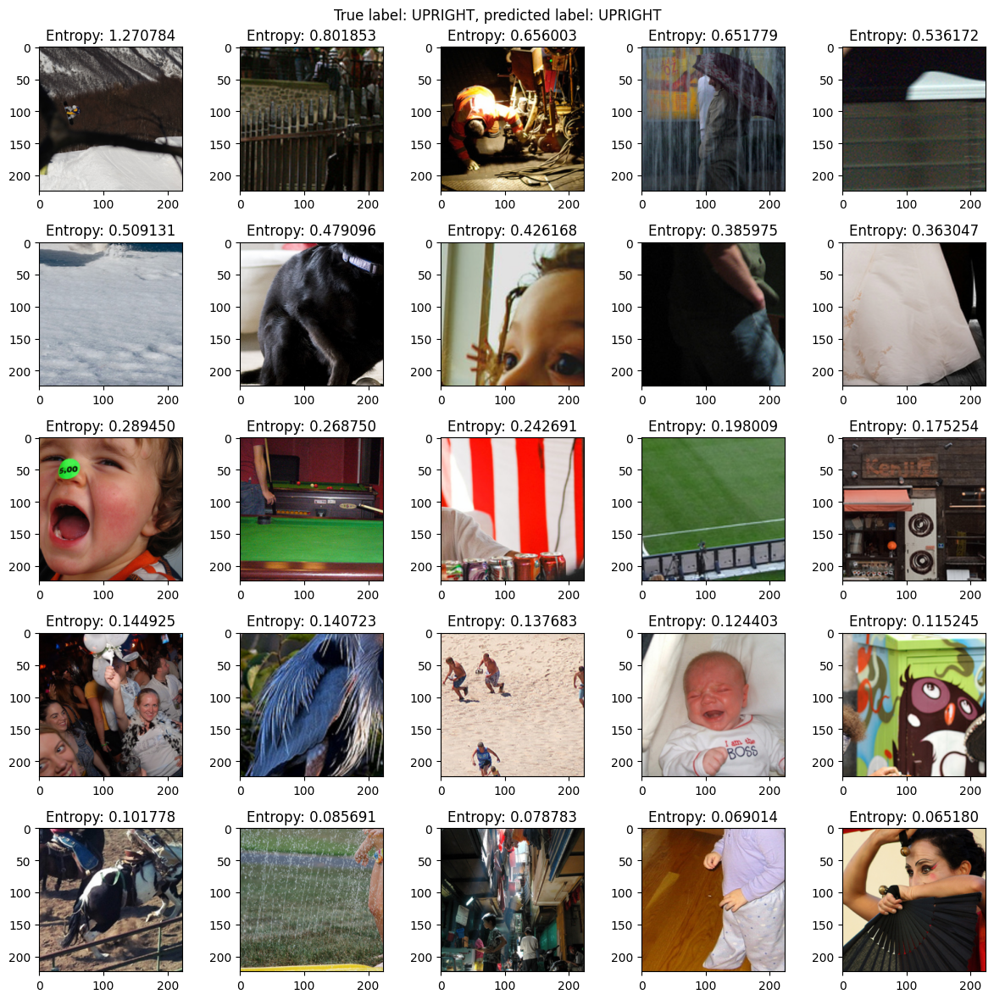

In [94]:
# Correctly predicted upright images
imshow_mislabeled(rotation_to_label[0], rotation_to_label[0], x, y, y_hat)

rows: 5, cols: 5, 0: axes 0 0
rows: 5, cols: 5, 1: axes 0 1
rows: 5, cols: 5, 2: axes 0 2
rows: 5, cols: 5, 3: axes 0 3
rows: 5, cols: 5, 4: axes 0 4
rows: 5, cols: 5, 5: axes 1 0
rows: 5, cols: 5, 6: axes 1 1
rows: 5, cols: 5, 7: axes 1 2
rows: 5, cols: 5, 8: axes 1 3
rows: 5, cols: 5, 9: axes 1 4
rows: 5, cols: 5, 10: axes 2 0
rows: 5, cols: 5, 11: axes 2 1
rows: 5, cols: 5, 12: axes 2 2
rows: 5, cols: 5, 13: axes 2 3
rows: 5, cols: 5, 14: axes 2 4
rows: 5, cols: 5, 15: axes 3 0
rows: 5, cols: 5, 16: axes 3 1
rows: 5, cols: 5, 17: axes 3 2
rows: 5, cols: 5, 18: axes 3 3
rows: 5, cols: 5, 19: axes 3 4
rows: 5, cols: 5, 20: axes 4 0
rows: 5, cols: 5, 21: axes 4 1
rows: 5, cols: 5, 22: axes 4 2
rows: 5, cols: 5, 23: axes 4 3
rows: 5, cols: 5, 24: axes 4 4


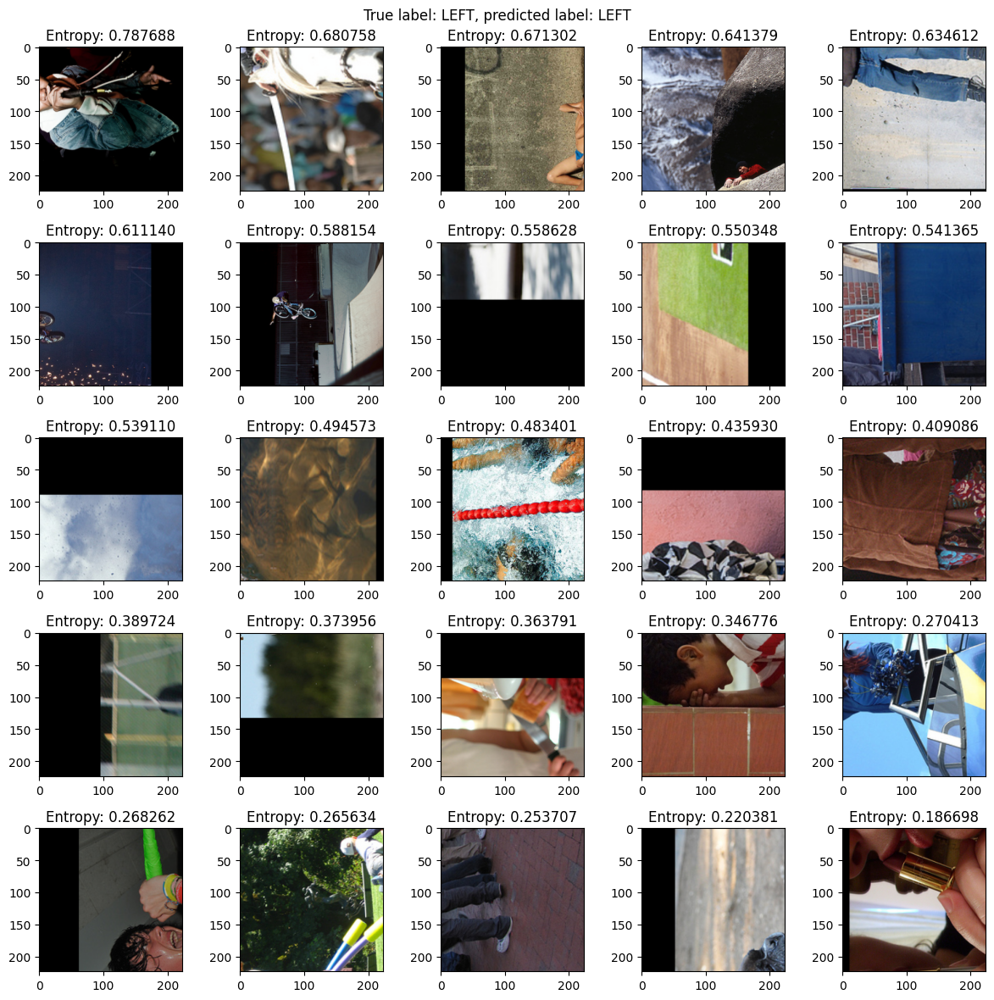

In [95]:
# Correctly predicted CCW rotated images
imshow_mislabeled(rotation_to_label[90], rotation_to_label[90], x, y, y_hat)

rows: 5, cols: 5, 0: axes 0 0
rows: 5, cols: 5, 1: axes 0 1
rows: 5, cols: 5, 2: axes 0 2
rows: 5, cols: 5, 3: axes 0 3
rows: 5, cols: 5, 4: axes 0 4
rows: 5, cols: 5, 5: axes 1 0
rows: 5, cols: 5, 6: axes 1 1
rows: 5, cols: 5, 7: axes 1 2
rows: 5, cols: 5, 8: axes 1 3
rows: 5, cols: 5, 9: axes 1 4
rows: 5, cols: 5, 10: axes 2 0
rows: 5, cols: 5, 11: axes 2 1
rows: 5, cols: 5, 12: axes 2 2
rows: 5, cols: 5, 13: axes 2 3
rows: 5, cols: 5, 14: axes 2 4
rows: 5, cols: 5, 15: axes 3 0
rows: 5, cols: 5, 16: axes 3 1
rows: 5, cols: 5, 17: axes 3 2
rows: 5, cols: 5, 18: axes 3 3
rows: 5, cols: 5, 19: axes 3 4
rows: 5, cols: 5, 20: axes 4 0
rows: 5, cols: 5, 21: axes 4 1
rows: 5, cols: 5, 22: axes 4 2
rows: 5, cols: 5, 23: axes 4 3
rows: 5, cols: 5, 24: axes 4 4


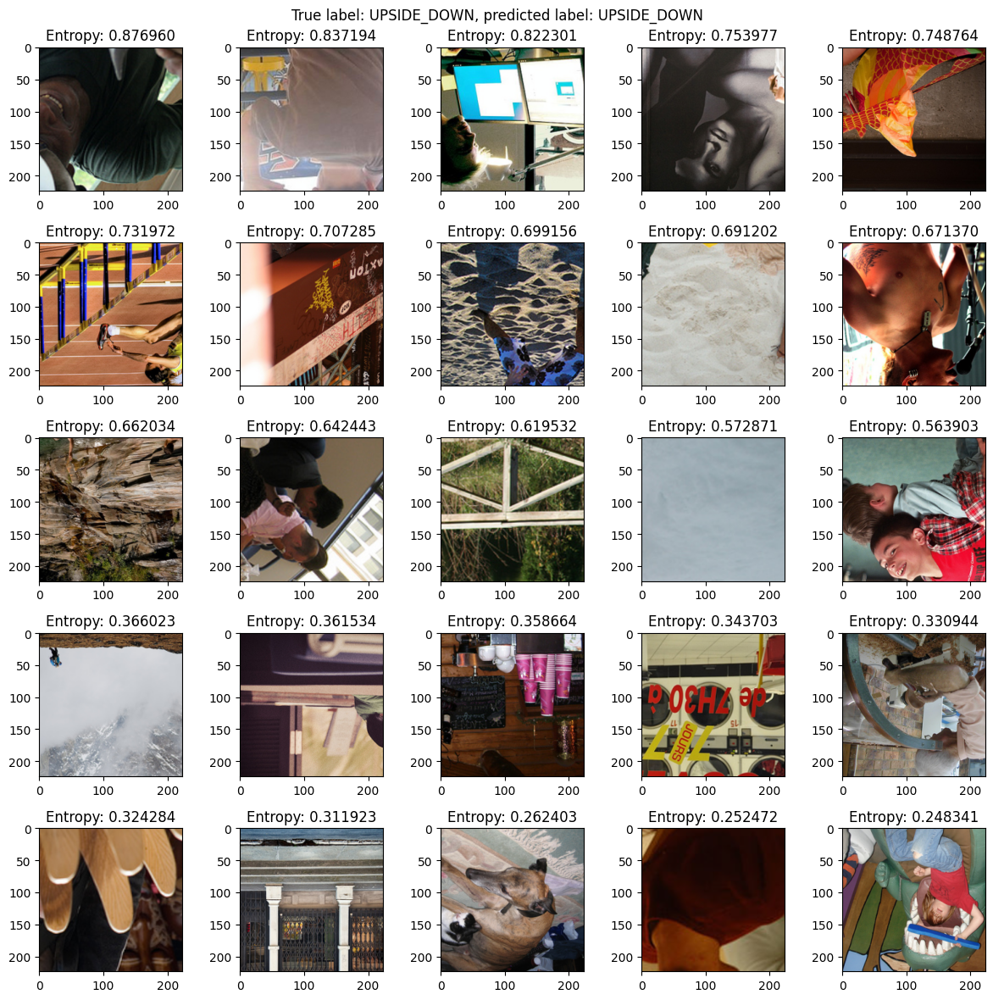

In [96]:
# Correctly predicted upside down images
imshow_mislabeled(rotation_to_label[180], rotation_to_label[180], x, y, y_hat)

rows: 5, cols: 5, 0: axes 0 0
rows: 5, cols: 5, 1: axes 0 1
rows: 5, cols: 5, 2: axes 0 2
rows: 5, cols: 5, 3: axes 0 3
rows: 5, cols: 5, 4: axes 0 4
rows: 5, cols: 5, 5: axes 1 0
rows: 5, cols: 5, 6: axes 1 1
rows: 5, cols: 5, 7: axes 1 2
rows: 5, cols: 5, 8: axes 1 3
rows: 5, cols: 5, 9: axes 1 4
rows: 5, cols: 5, 10: axes 2 0
rows: 5, cols: 5, 11: axes 2 1
rows: 5, cols: 5, 12: axes 2 2
rows: 5, cols: 5, 13: axes 2 3
rows: 5, cols: 5, 14: axes 2 4
rows: 5, cols: 5, 15: axes 3 0
rows: 5, cols: 5, 16: axes 3 1
rows: 5, cols: 5, 17: axes 3 2
rows: 5, cols: 5, 18: axes 3 3
rows: 5, cols: 5, 19: axes 3 4
rows: 5, cols: 5, 20: axes 4 0
rows: 5, cols: 5, 21: axes 4 1
rows: 5, cols: 5, 22: axes 4 2
rows: 5, cols: 5, 23: axes 4 3
rows: 5, cols: 5, 24: axes 4 4


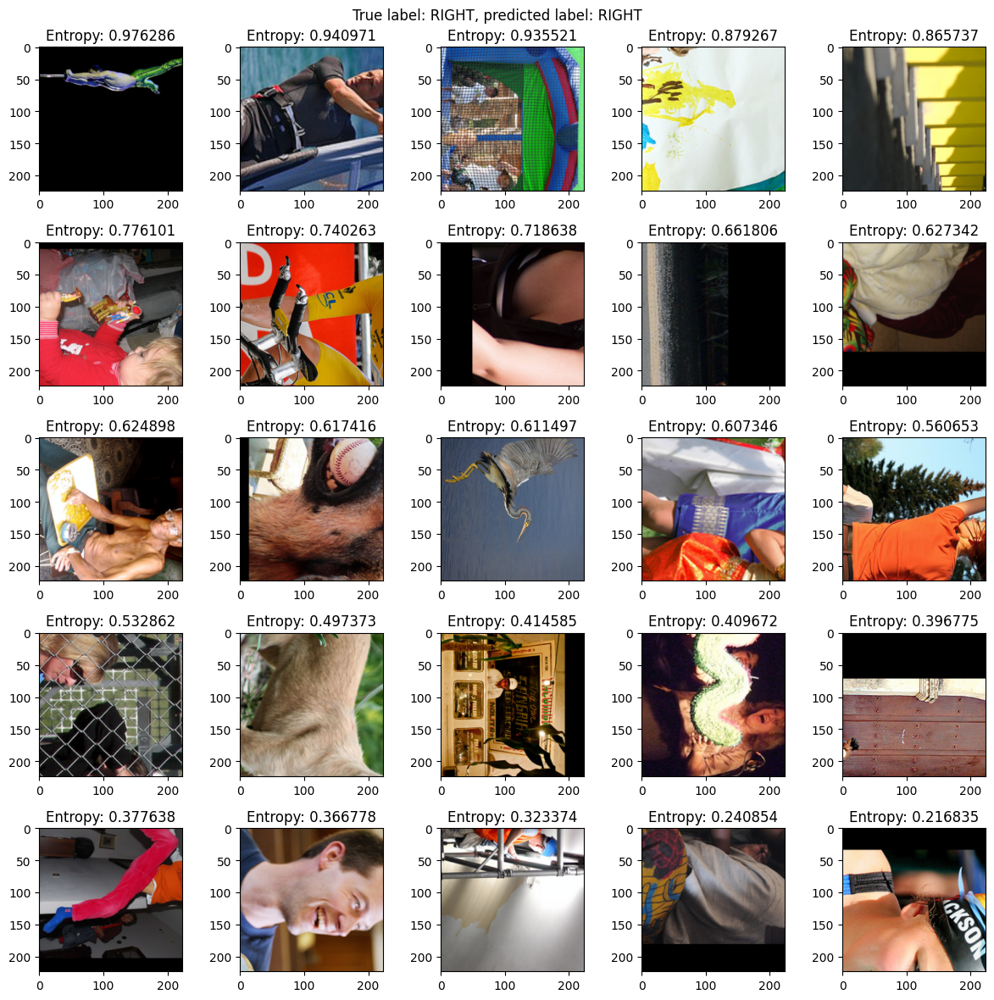

In [97]:
# True predicted CW rotation
imshow_mislabeled(rotation_to_label[270], rotation_to_label[270], x, y, y_hat)

rows: 2, cols: 3, 0: axes 0 0
rows: 2, cols: 3, 1: axes 0 1
rows: 2, cols: 3, 2: axes 0 2
rows: 2, cols: 3, 3: axes 1 0
rows: 2, cols: 3, 4: axes 1 1


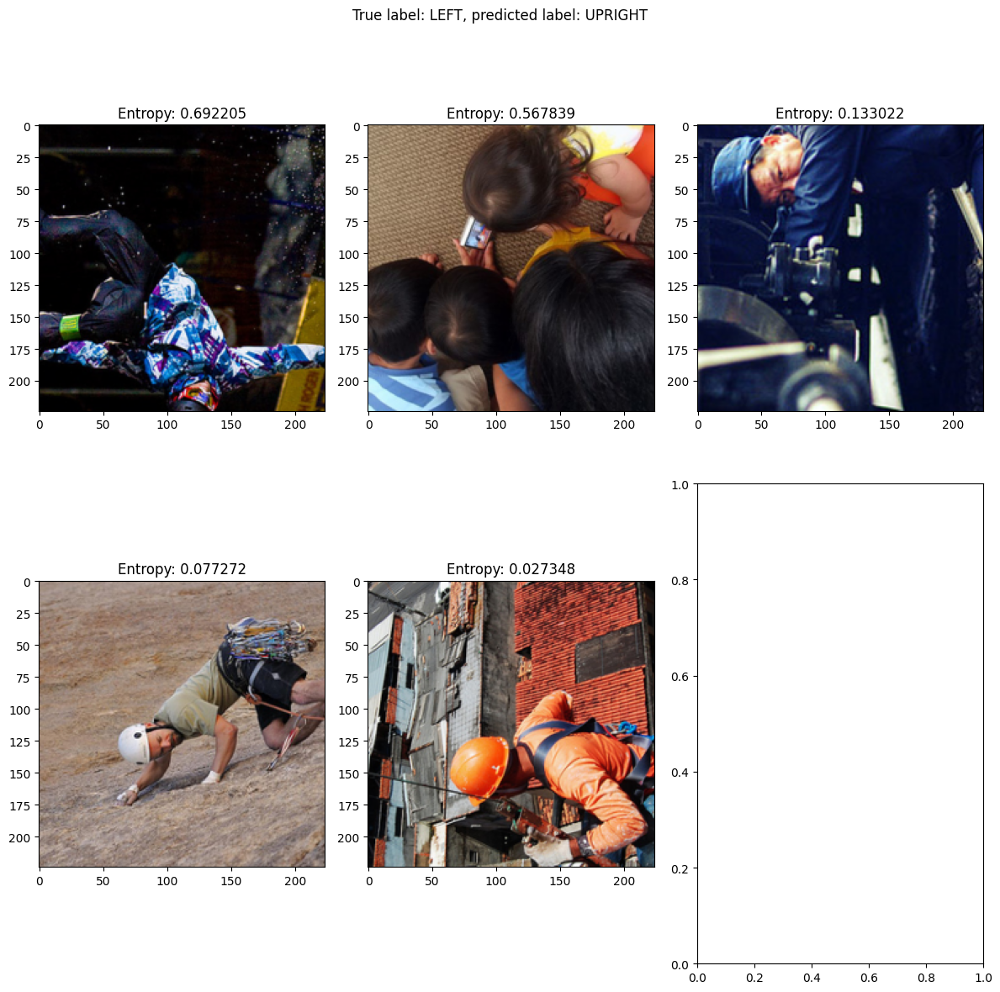

In [98]:
# true CCW, predicted upright
imshow_mislabeled(rotation_to_label[0], rotation_to_label[90], x, y, y_hat)
# Honestly alright call on this one, was pretty confusing.

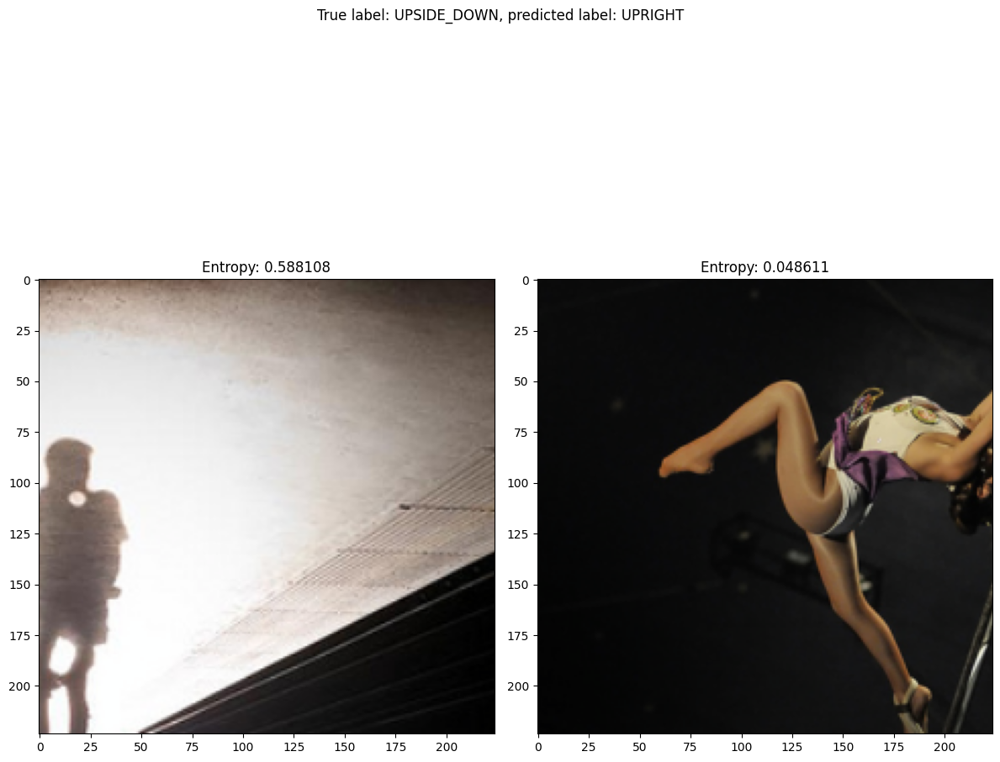

In [99]:
# true upside down, predicted upright
imshow_mislabeled(rotation_to_label[0], rotation_to_label[180], x, y, y_hat)
# except for the surfer others are kinda ambiguous

rows: 2, cols: 2, 0: axes 0 0
rows: 2, cols: 2, 1: axes 0 1
rows: 2, cols: 2, 2: axes 1 0
rows: 2, cols: 2, 3: axes 1 1


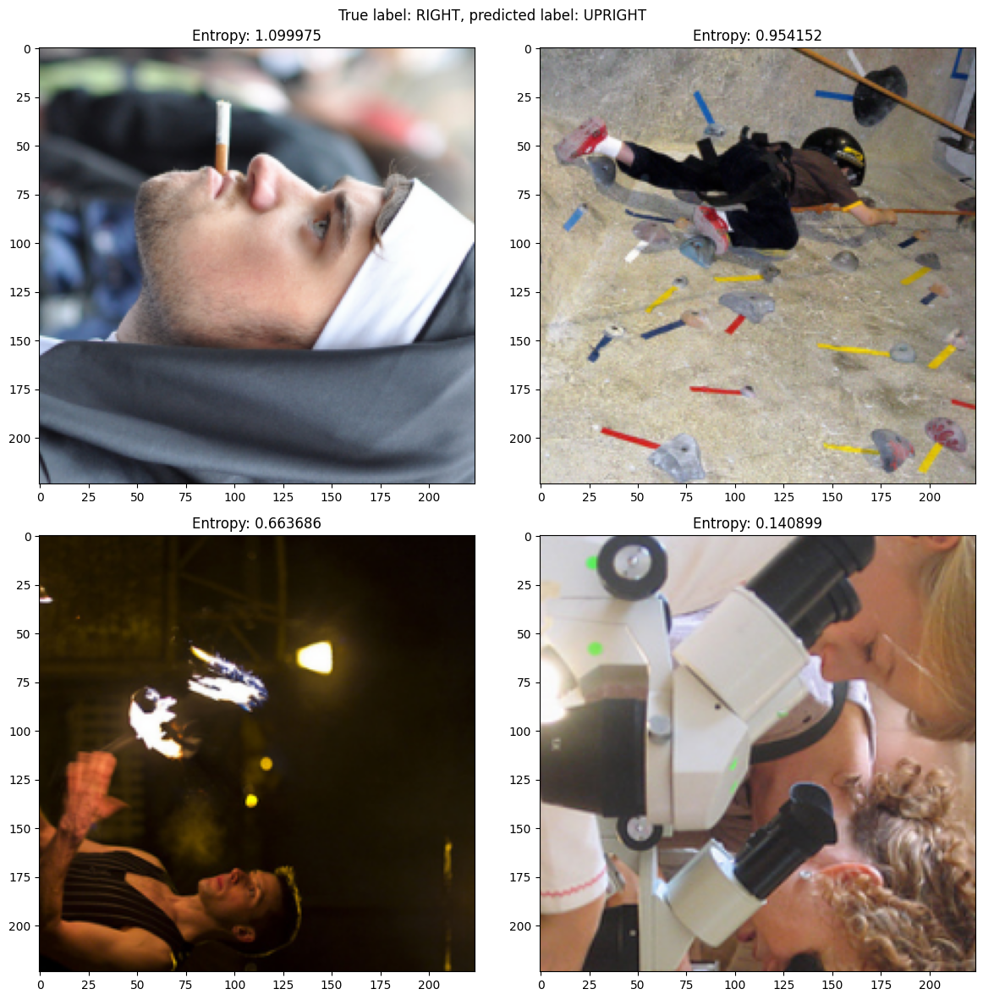

In [100]:
# true CW rotation, predicted upright
imshow_mislabeled(rotation_to_label[0], rotation_to_label[270], x, y, y_hat)

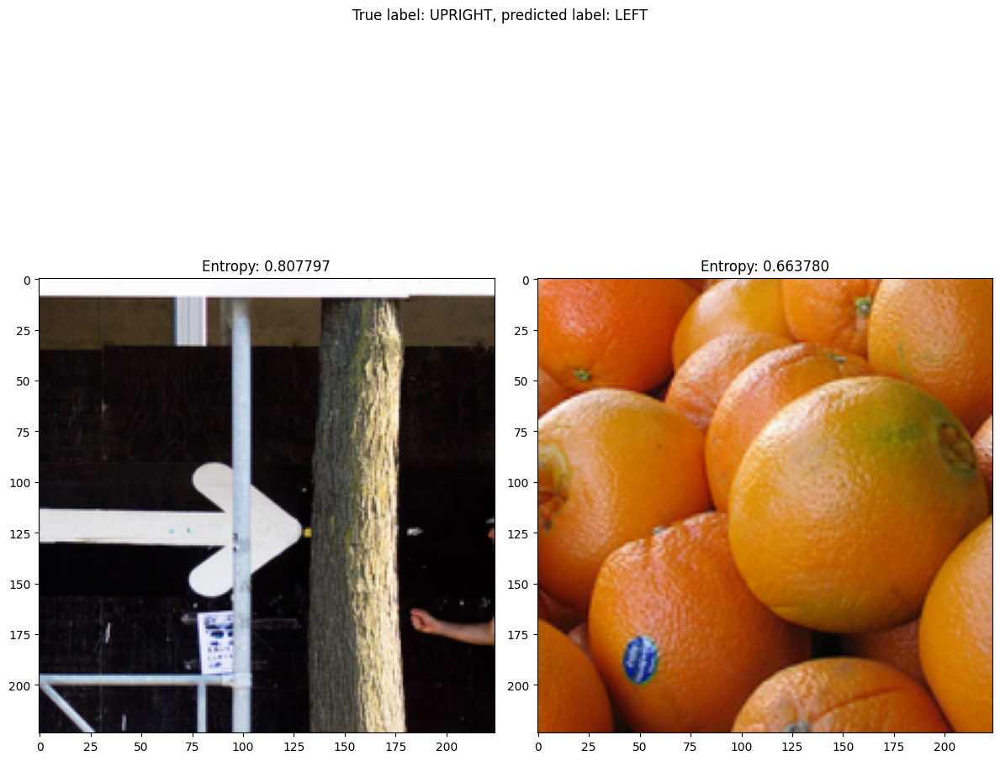

In [101]:
# true upright, predicted CCW rotation
imshow_mislabeled(rotation_to_label[90], rotation_to_label[0], x, y, y_hat)

rows: 2, cols: 3, 0: axes 0 0
rows: 2, cols: 3, 1: axes 0 1
rows: 2, cols: 3, 2: axes 0 2
rows: 2, cols: 3, 3: axes 1 0
rows: 2, cols: 3, 4: axes 1 1


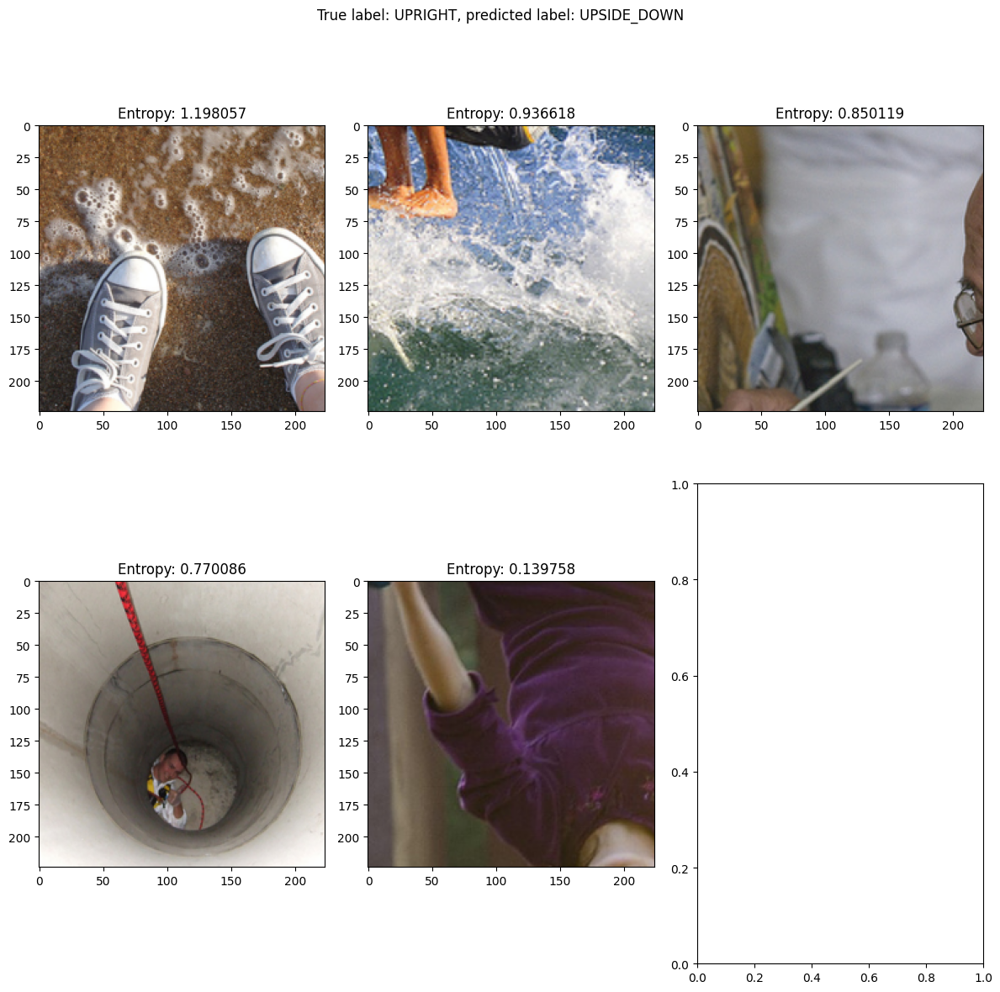

In [102]:
# true upright, predicted upside down
imshow_mislabeled(rotation_to_label[180], rotation_to_label[0], x, y, y_hat)

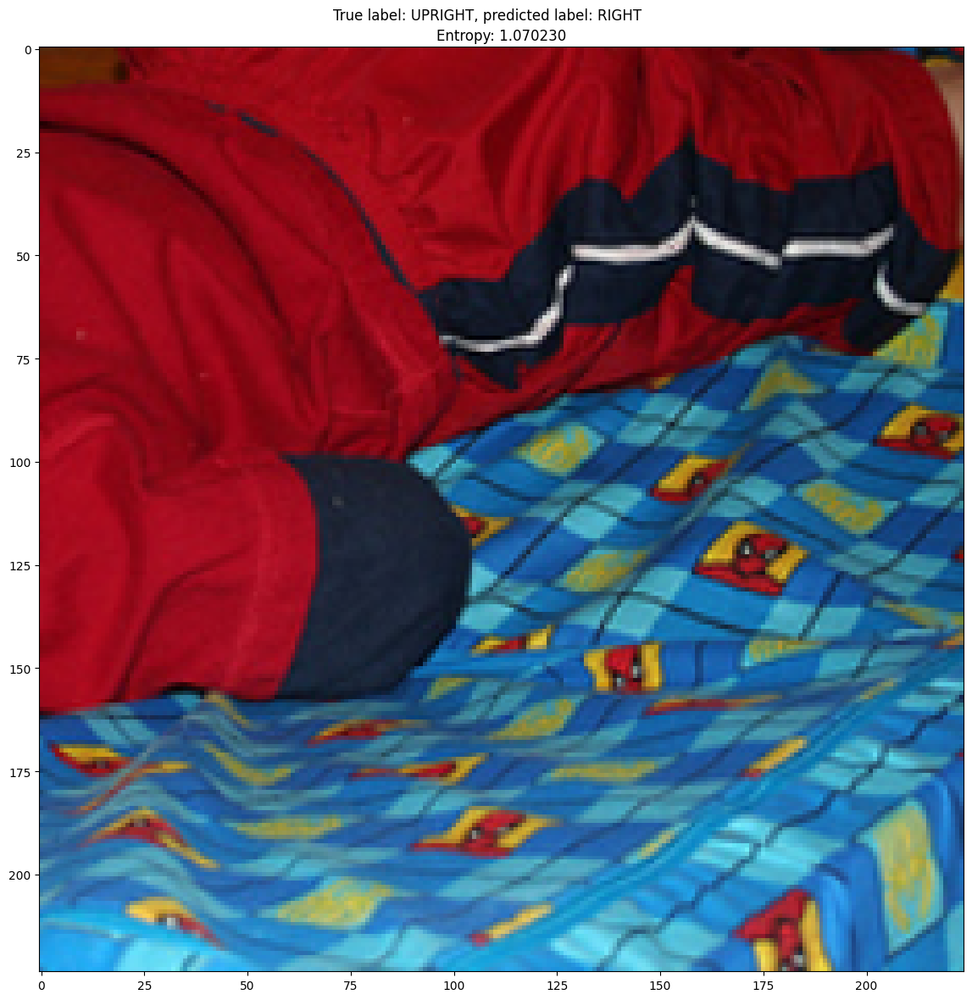

In [103]:
# true upright, predicted CW
imshow_mislabeled(rotation_to_label[270], rotation_to_label[0], x, y, y_hat)

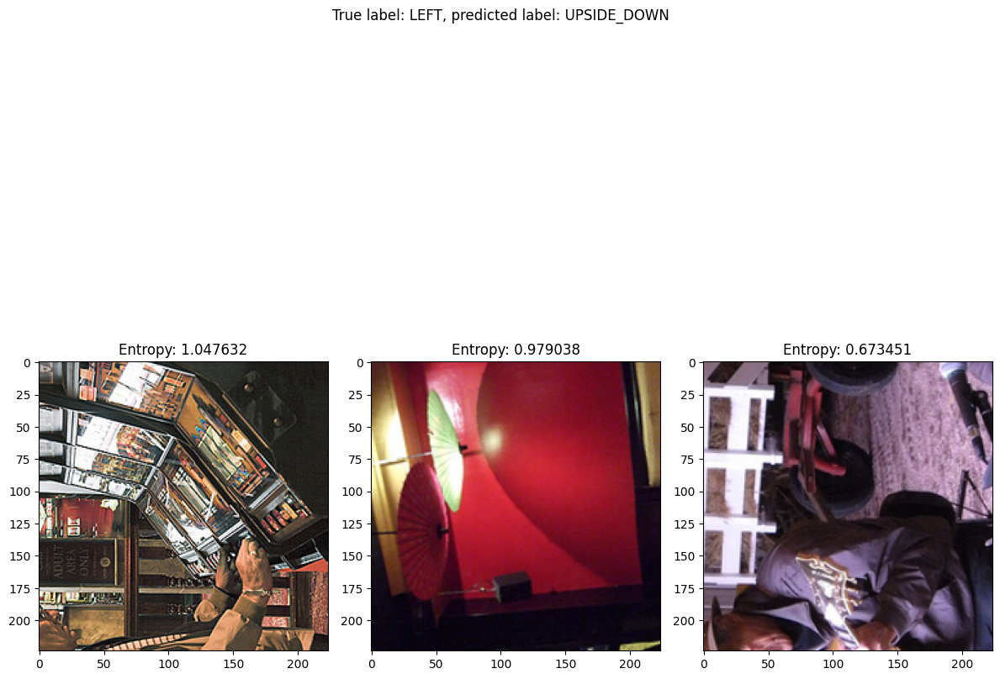

In [104]:
# true CCW predicted upside down
imshow_mislabeled(pred_class_label=rotation_to_label[180], true_class_label=rotation_to_label[90], x=x, y=y, y_hat=y_hat)

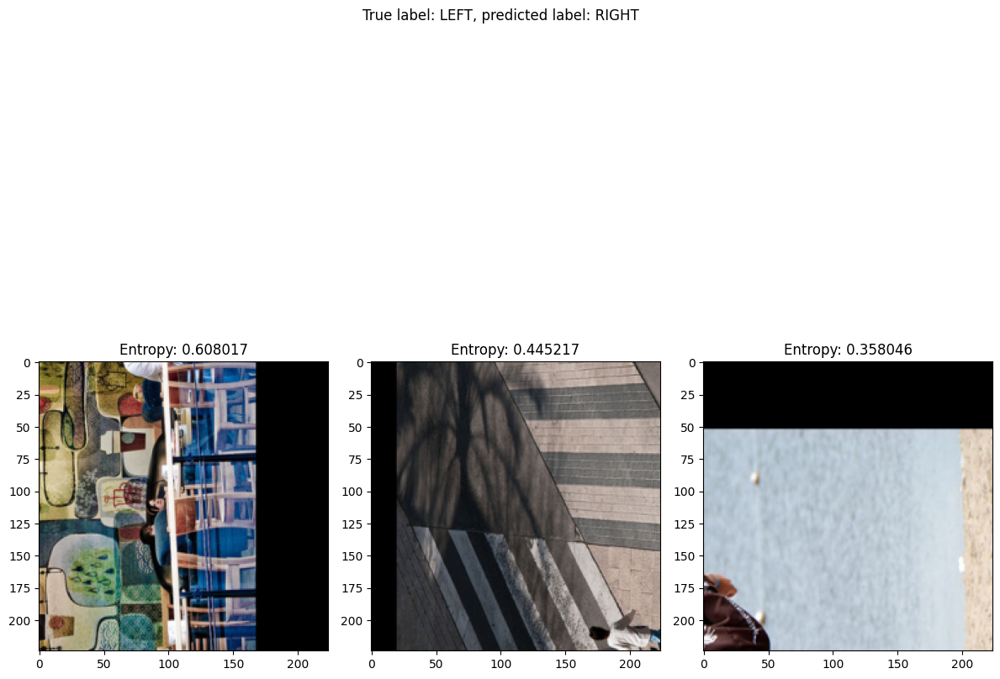

In [105]:
# true CCW predicted CW
imshow_mislabeled(pred_class_label=rotation_to_label[270], true_class_label=rotation_to_label[90], x=x, y=y, y_hat=y_hat)

In [106]:
# true upside down predicted CCW
imshow_mislabeled(pred_class_label=rotation_to_label[90], true_class_label=rotation_to_label[180], x=x, y=y, y_hat=y_hat)

ZeroDivisionError: float division by zero

rows: 2, cols: 3, 0: axes 0 0
rows: 2, cols: 3, 1: axes 0 1
rows: 2, cols: 3, 2: axes 0 2
rows: 2, cols: 3, 3: axes 1 0
rows: 2, cols: 3, 4: axes 1 1


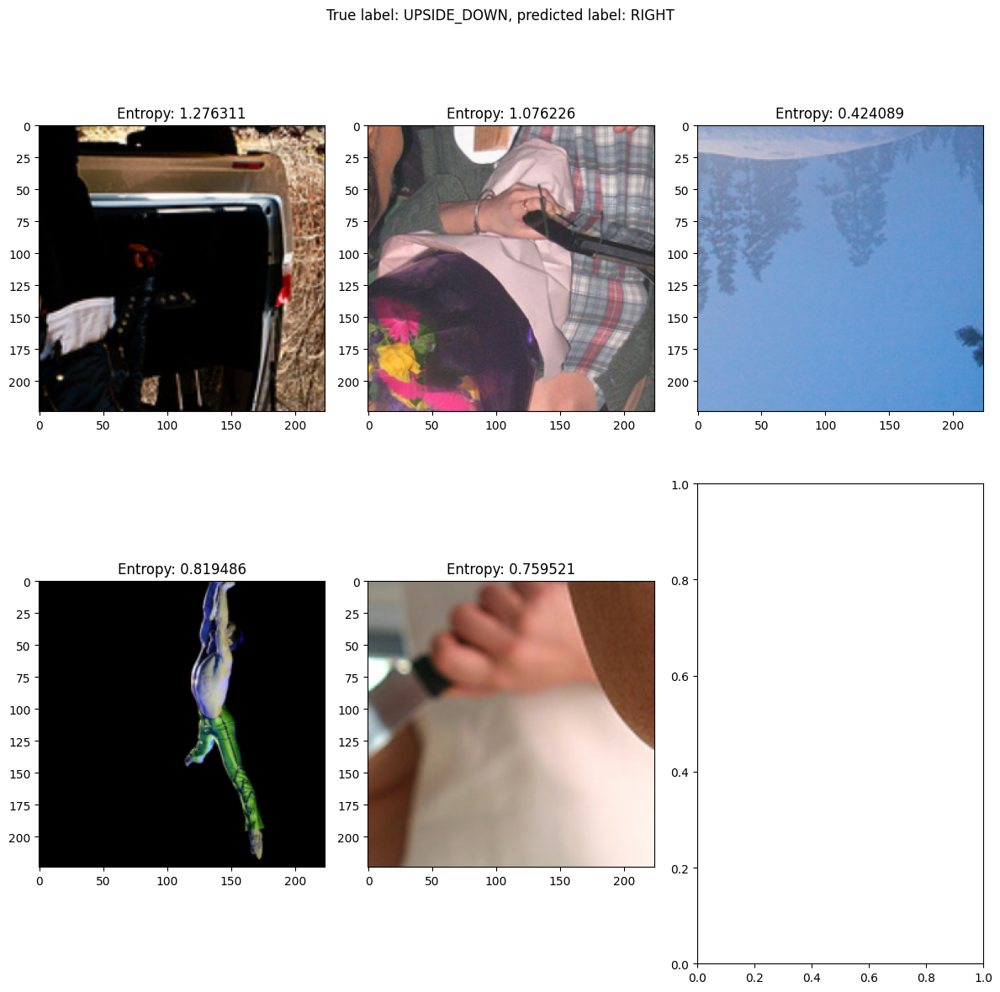

In [ ]:
# true upside down, predicted CW
imshow_mislabeled(pred_class_label=rotation_to_label[270], true_class_label=rotation_to_label[180], x=x, y=y, y_hat=y_hat)

rows: 2, cols: 3, 0: axes 0 0
rows: 2, cols: 3, 1: axes 0 1
rows: 2, cols: 3, 2: axes 0 2
rows: 2, cols: 3, 3: axes 1 0
rows: 2, cols: 3, 4: axes 1 1


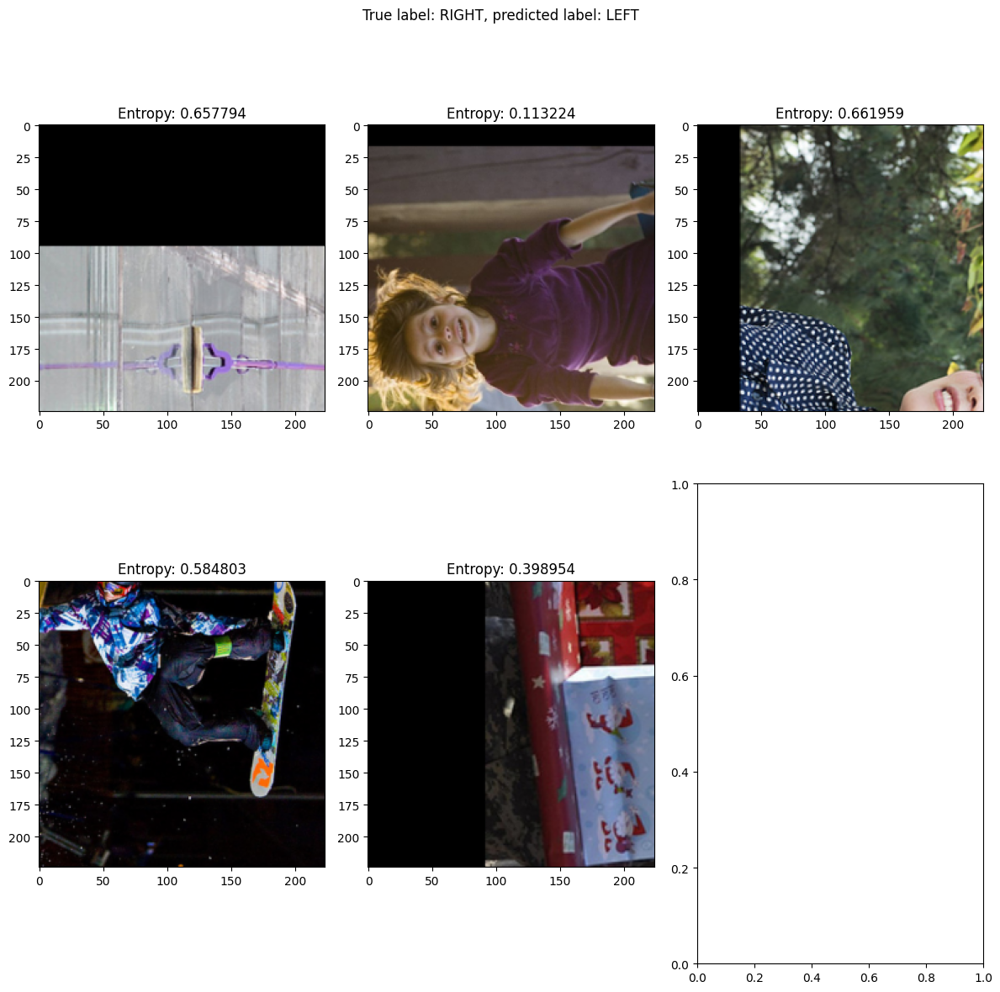

In [ ]:
# true CW predicted CCW
imshow_mislabeled(pred_class_label=rotation_to_label[90], true_class_label=rotation_to_label[270], x=x, y=y, y_hat=y_hat)

rows: 2, cols: 3, 0: axes 0 0
rows: 2, cols: 3, 1: axes 0 1
rows: 2, cols: 3, 2: axes 0 2
rows: 2, cols: 3, 3: axes 1 0
rows: 2, cols: 3, 4: axes 1 1
rows: 2, cols: 3, 5: axes 1 2


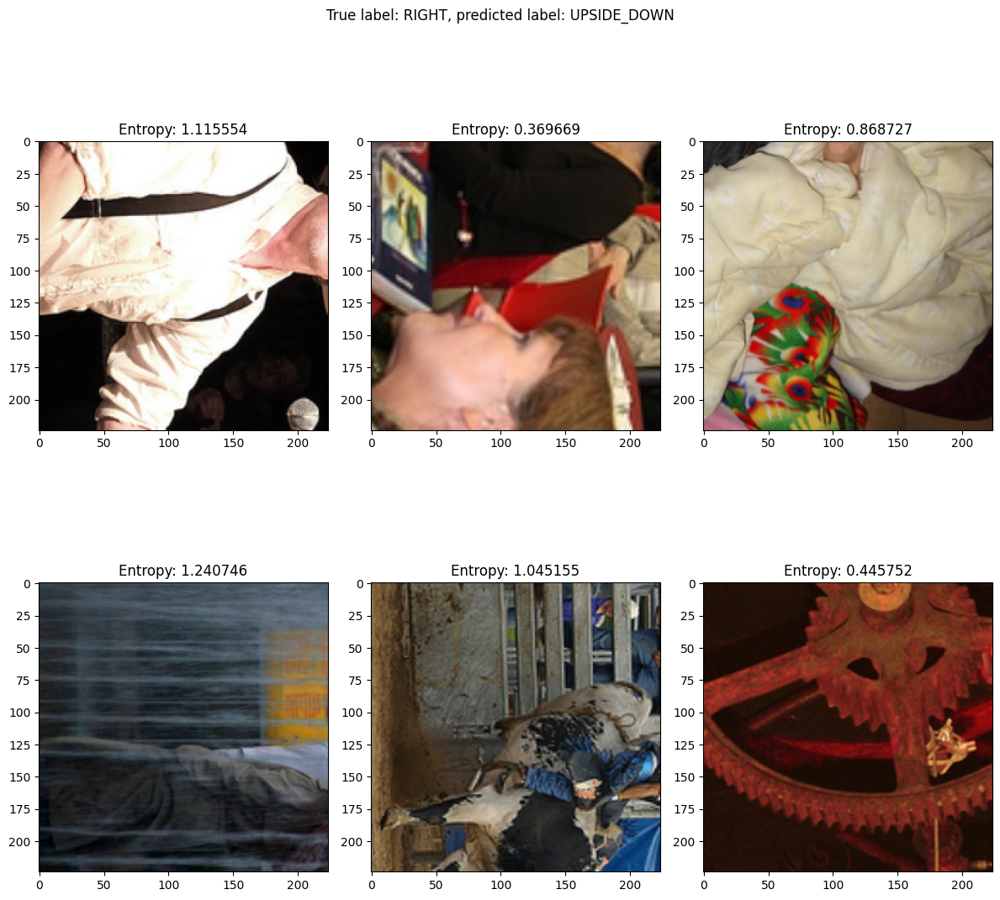

In [ ]:
# true CW predicted upside down
imshow_mislabeled(pred_class_label=rotation_to_label[180], true_class_label=rotation_to_label[270], x=x, y=y, y_hat=y_hat)